In [1]:
import uproot
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd


In [2]:
from sklearn.cluster import KMeans

def fps_sampling(points, n_samples):
    """
    Perform Farthest Point Sampling on the input point cloud.
    
    :param points: numpy array of shape (N, 3) representing the point cloud
    :param n_samples: number of points to sample
    :return: indices of sampled points
    """
    N = points.shape[0]
    sampled_indices = np.zeros(n_samples, dtype=int)
    distances = np.full(N, np.inf)
    
    # Randomly choose the first point
    sampled_indices[0] = np.random.randint(N)
    
    for i in range(1, n_samples):
        distances = np.minimum(distances, np.sum((points - points[sampled_indices[i-1]])**2, axis=1))
        sampled_indices[i] = np.argmax(distances)
    
    return sampled_indices

def fps_clustering_downsample(points, n_samples):
    """
    Downsample the point cloud using FPS and clustering.
    
    :param points: numpy array of shape (N, 3) representing the point cloud
    :param n_samples: number of points in the downsampled cloud
    :return: downsampled point cloud
    """
    # Perform FPS to get initial samples
    sampled_indices = fps_sampling(points, n_samples)
    sampled_points = points[sampled_indices]
    
    # Use K-means clustering to associate other points with the samples
    kmeans = KMeans(n_clusters=n_samples, init=sampled_points, n_init=1, max_iter=100)
    kmeans.fit(points)
    
    # Compute the new point positions as the mean of each cluster
    new_points = np.array([points[kmeans.labels_ == i].mean(axis=0) for i in range(n_samples)])
    
    return new_points

In [3]:
# this celltree doesn't look like it has the spacepoints I'm interested in, it must be a different output of the ArtROOTToBEE generation
# https://docs.google.com/document/d/1T-__tCrazXoLGUeJ5ol4xlGKHMxlepX2sDVy3ufMt8g/edit?tab=t.0

f = uproot.open("test_data_files/celltree_from_ArtROOTToBEE.root")

f["Event"]["Sim"].keys()

# truth depositions also exist in /exp/uboone/app/users/lhagaman/WorkAreaArtROOTToBEE/bee/data
# there must be a more direct way to get those from a root file during the BEE generation process though


['eventNo',
 'runNo',
 'subRunNo',
 'eventTime',
 'triggerNo',
 'triggerTime',
 'beamgateTime',
 'triggerBits',
 'raw_nChannel',
 'raw_channelId',
 'raw_wf',
 'calib_nChannel',
 'calib_channelId',
 'calib_wf',
 'oh_nHits',
 'oh_channel',
 'oh_bgtime',
 'oh_trigtime',
 'oh_pe',
 'of_nFlash',
 'of_t',
 'of_peTotal',
 'of_multiplicity',
 'pe_opdet',
 'simide_size',
 'simide_channelIdY',
 'simide_trackId',
 'simide_tdc',
 'simide_x',
 'simide_y',
 'simide_z',
 'simide_numElectrons',
 'mc_Ntrack',
 'mc_id',
 'mc_pdg',
 'mc_process',
 'mc_mother',
 'mc_daughters',
 'mc_startXYZT',
 'mc_endXYZT',
 'mc_startMomentum',
 'mc_endMomentum',
 'mc_trackPosition',
 'mc_isnu',
 'mc_nGeniePrimaries',
 'mc_nu_pdg',
 'mc_nu_ccnc',
 'mc_nu_mode',
 'mc_nu_intType',
 'mc_nu_target',
 'mc_hitnuc',
 'mc_hitquark',
 'mc_nu_Q2',
 'mc_nu_W',
 'mc_nu_X',
 'mc_nu_Y',
 'mc_nu_Pt',
 'mc_nu_Theta',
 'mc_nu_pos',
 'mc_nu_mom']

In [4]:
f = uproot.open("test_data_files/nue_14338_312_15601.root")

rse_df = f["Trun"].arrays(["runNo", "subRunNo", "eventNo"], library="pd")
track_shower_spacepoints_df = f["T_rec"].arrays(["x", "y", "z", "q"], library="pd")
nu_trajectory_spacepoints_blob_df = f["T_rec_charge_blob"].arrays(["x", "y", "z", "q"], library="pd")
cosmic_spacepoints_df = f["T_cluster"].arrays(["x", "y", "z", "q"], library="pd")

cosmic_spacepoints_xyz = np.column_stack((cosmic_spacepoints_df["x"], cosmic_spacepoints_df["y"], cosmic_spacepoints_df["z"]))
downsampled_cosmic_spacepoints = fps_clustering_downsample(cosmic_spacepoints_xyz, 1000)

downsampled_cosmic_spacepoints_df = pd.DataFrame(downsampled_cosmic_spacepoints, columns=["x", "y", "z"])

print("\nrse_df")
display(rse_df)
print("\nrack_shower_spacepoints_df")
display(track_shower_spacepoints_df)
print("\nnu_trajectory_spacepoints_blob_df")
display(nu_trajectory_spacepoints_blob_df)
print("\ncosmic_spacepoints_df")
display(cosmic_spacepoints_df)
print("\ndownsampled_cosmic_spacepoints_df")
display(downsampled_cosmic_spacepoints_df)




rse_df


,runNo,subRunNo,eventNo
0,14338,312,15601



rack_shower_spacepoints_df


,x,y,z,q
0,230.549390,41.759833,389.05,0.0
1,230.549390,40.720615,389.05,0.0
2,230.549390,41.240231,389.95,0.0
3,230.549390,40.547394,389.35,0.0
4,230.549390,40.374191,389.65,0.0
...,...,...,...,...
6304,232.751392,35.091431,386.50,0.0
6305,232.751392,35.264636,386.80,0.0
6306,232.751392,34.745020,386.50,0.0
6307,232.751392,34.225412,386.80,0.0



nu_trajectory_spacepoints_blob_df


,x,y,z,q
0,231.887524,34.175266,388.841650,7475.049165
1,229.179150,32.433475,430.516211,3006.497535
2,150.100830,77.061292,461.181299,1844.818644
3,150.407190,74.816907,509.084668,1783.721039
4,226.948120,31.947922,432.749902,2665.271074
...,...,...,...,...
307,231.887524,34.175266,388.841650,7475.049165
308,232.179663,33.949860,388.368530,4997.628508
309,232.166040,34.253204,387.851050,7809.560379
310,232.288135,34.333582,387.140576,10980.930803



cosmic_spacepoints_df


,x,y,z,q
0,230.329199,32.060339,401.950000,468.666667
1,230.329199,31.887134,402.250000,213.000000
2,231.650391,34.398608,403.900000,8864.000000
3,231.650391,33.878995,404.800000,6109.000000
4,231.650391,33.532584,405.400000,2033.000000
...,...,...,...,...
147963,-112.081799,110.089197,2.200025,1731.333333
147964,217.557593,-106.850293,229.150000,3510.333333
147965,217.557593,-107.023499,229.450000,3126.000000
147966,217.777783,-106.850293,229.150000,3215.000000



downsampled_cosmic_spacepoints_df


,x,y,z
0,-25.899878,-75.296167,373.301653
1,183.308679,76.183106,1033.534677
2,350.619229,43.707324,162.023075
3,-173.162270,-82.617162,843.227668
4,-112.191895,110.002643,2.050112
...,...,...,...
995,-144.591555,39.172895,646.144737
996,323.951855,-46.796725,816.575117
997,266.860586,104.320731,909.766205
998,285.420593,0.098053,68.571720


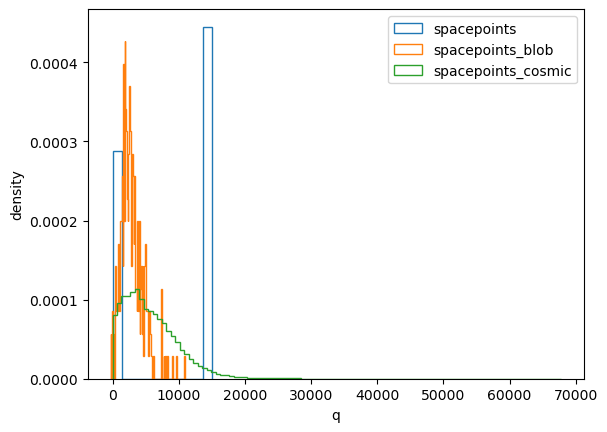

In [5]:
plt.figure()
plt.hist(track_shower_spacepoints_df["q"], bins=11, histtype="step", density=True, label="spacepoints")
plt.hist(nu_trajectory_spacepoints_blob_df["q"], bins=100, histtype="step", density=True, label="spacepoints_blob")
plt.hist(cosmic_spacepoints_df["q"], bins=100, histtype="step", density=True, label="spacepoints_cosmic")
plt.legend()
plt.xlabel("q")
plt.ylabel("density")
plt.show()


In [6]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

fig = make_subplots(rows=1, cols=1, specs=[[{'type': 'scene'}]])

fig.add_trace(go.Scatter3d(
    x=nu_trajectory_spacepoints_blob_df["z"],
    y=nu_trajectory_spacepoints_blob_df["x"],
    z=nu_trajectory_spacepoints_blob_df["y"],
    mode='markers',
    marker=dict(
        size=2,
        color=nu_trajectory_spacepoints_blob_df["q"],
        colorscale='Jet',
        opacity=0.8
    ),
    name='Neutrino Cluster Spacepoints'
))

fig.add_trace(go.Scatter3d(
    x=cosmic_spacepoints_df["z"],
    y=cosmic_spacepoints_df["x"],
    z=cosmic_spacepoints_df["y"],
    mode='markers',
    marker=dict(
        size=1,
        color='black',
        opacity=0.005
    ),
    name='Cosmic Spacepoints'
))

# downsampled_cosmic_spacepoints
fig.add_trace(go.Scatter3d(
    x=downsampled_cosmic_spacepoints_df["z"],
    y=downsampled_cosmic_spacepoints_df["x"],
    z=downsampled_cosmic_spacepoints_df["y"],
    mode='markers',
    marker=dict(
        size=1,
        color='red',
        opacity=0.5
    ),
    name='Downsampled Cosmic Spacepoints'
))


fig.update_layout(
    scene=dict(
        xaxis_title='z',
        yaxis_title='x',
        zaxis_title='y',
        aspectmode='data',
        aspectratio=dict(x=1, y=1, z=1),
        camera=dict(
            up=dict(x=0, y=0, z=1),
            center=dict(x=0, y=0, z=0),
            eye=dict(x=-1.5, y=-1.5, z=0.5)
        ),
    ),
    width=1000,
    height=800,
)

fig.show()
